
# Import packages

In [1]:
# detect if running in colab
try:
    import google.colab

    ! pip install torchmetrics
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

import gc
import math
import os
import random
import time
from pprint import pprint

import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision
import wandb
from datasets import load_from_disk
from PIL.TiffImagePlugin import TiffImageFile
from torch.utils.data import DataLoader, Dataset
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchvision import tv_tensors
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.transforms import v2 as T
from tqdm.notebook import tqdm

# --- A100 OPTIMIZATION: ENABLE TF32 ---
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

/usr/local/lib/python3.12/dist-packages/torch/backends/__init__.py:46: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  self.setter(val)


In [2]:
if IN_COLAB:
    from google.colab import drive

    drive.mount("/content/drive")
    BASE_PATH = "/content/drive/MyDrive/datasets/SelvaBox/saved/"
else:
    BASE_PATH = "../data/selvabox/"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
def setup_seed(seed):
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    torch.backends.cudnn.deterministic = True


setup_seed(42)

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


# Load data

In [5]:
hf_train_ds = load_from_disk(BASE_PATH + "train")
hf_val_ds = load_from_disk(BASE_PATH + "validation")
hf_test_ds = load_from_disk(BASE_PATH + "test")

Loading dataset from disk:   0%|          | 0/34 [00:00<?, ?it/s]

Loading dataset from disk:   0%|          | 0/24 [00:00<?, ?it/s]

In [6]:
print(f"Number of training samples: {len(hf_train_ds)}")
print(f"Number of validation samples: {len(hf_val_ds)}")
print(f"Number of test samples: {len(hf_test_ds)}")

Number of training samples: 585
Number of validation samples: 387
Number of test samples: 1477


# Utility functions

In [7]:
class EarlyStopper:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_score = -float(
            "inf"
        )  # Looking for max mAP, so init with negative inf
        self.early_stop = False

    def __call__(self, current_score):
        # Logic for maximizing metric (mAP)
        if current_score > (self.best_score + self.min_delta):
            self.best_score = current_score
            self.counter = 0
        else:
            self.counter += 1
            print(
                f"   --> EarlyStopping counter: {self.counter} out of {self.patience}"
            )
            if self.counter >= self.patience:
                self.early_stop = True

In [8]:
def plot_image(
    img, boxes, scores=None, labels=None, class_names=None, save_path=None, show=True
):
    """
    Plots bounding boxes on an image with optional scores and labels.

    Args:
        img (np.array | torch.Tensor): Input image. Shape [H, W, C] (numpy) or [C, H, W] (torch).
        boxes (np.array | torch.Tensor): Bounding boxes [N, 4] format (xmin, ymin, xmax, ymax).
        scores (np.array | torch.Tensor, optional): Confidence scores [N]. Defaults to None.
        labels (np.array | torch.Tensor, optional): Class indices [N]. Defaults to None.
        class_names (list, optional): List of class string names. Defaults to None.
        save_path (str, optional): Path to save the figure. Defaults to None.
        show (bool, optional): Whether to display the plot. Defaults to True.
    """

    # --- 1. Data Standardization ---
    # Convert PyTorch tensors to Numpy if necessary
    if isinstance(img, torch.Tensor):
        img = img.cpu().numpy()
        # If image is [C, H, W], transpose to [H, W, C] for Matplotlib
        if img.shape[0] < img.shape[2]:
            img = img.transpose(1, 2, 0)

    if isinstance(boxes, torch.Tensor):
        boxes = boxes.cpu().numpy()

    if isinstance(scores, torch.Tensor):
        scores = scores.cpu().numpy()

    if isinstance(labels, torch.Tensor):
        labels = labels.cpu().numpy()

    # Normalize image range if it's float 0-1, mostly for display consistency
    # (Matplotlib handles 0-1 floats or 0-255 ints, but mixing is bad)
    if img.dtype == np.float32 or img.dtype == np.float64:
        img = np.clip(img, 0, 1)

    # --- 2. Setup Figure ---
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(img)

    # --- 3. Color Setup ---
    # If no class names provided, default to a generic list
    if class_names is None:
        if labels is not None:
            max_label = int(np.max(labels))
            class_names = [f"Class {i}" for i in range(max_label + 1)]
        else:
            class_names = ["Object"]

    # Generate distinct colors for classes
    cmap = plt.get_cmap("tab20b")
    colors = [cmap(i) for i in np.linspace(0, 1, len(class_names))]

    # --- 4. Plotting Loop ---
    for i, box in enumerate(boxes):
        xmin, ymin, xmax, ymax = box

        # Determine Label
        if labels is not None:
            cls_id = int(labels[i])
        else:
            cls_id = 0  # Default to 0 if no labels provided

        color = colors[cls_id % len(colors)]
        class_name = (
            class_names[cls_id] if cls_id < len(class_names) else f"Class {cls_id}"
        )

        # Draw Rectangle
        width = xmax - xmin
        height = ymax - ymin
        rect = patches.Rectangle(
            (xmin, ymin), width, height, linewidth=2, edgecolor=color, facecolor="none"
        )
        ax.add_patch(rect)

        # Build Text String
        display_text = class_name
        if scores is not None:
            display_text += f" {int(100 * scores[i])}%"

        # Draw Text with background
        ax.text(
            xmin,
            ymin,
            display_text,
            color="white",
            fontsize=10,
            verticalalignment="top",
            bbox={
                "color": color,
                "pad": 2,
                "alpha": 0.8,
            },  # Added alpha for better visibility
        )

    plt.axis("off")  # Hide axes ticks

    if save_path:
        plt.savefig(save_path, bbox_inches="tight")

    if show:
        plt.show()
    else:
        plt.close()

# Hyper-parameters

In [9]:
CONFIG = {
    "project_name": "selva-box-tree-detection",  # WandB project name
    "name": "multires-fasterrcnn-experiment",
    "num_classes": 2,  # Background + your classes (e.g., 1 class + 1 background = 2)
    "batch_size": 16,
    "num_workers": 4,
    "num_epochs": 20,
    "learning_rate": 0.005,
    "momentum": 0.9,
    "weight_decay": 0.0005,
    "step_size": 3,  # Scheduler step size
    "gamma": 0.1,  # Scheduler gamma
    "patience": 5,  # Early stopping patience
    "device": device,
    "model_name": "fasterrcnn_resnet50_fpn",
    "model_min_size": 1024,
    "model_max_size": 2000,
}

In [10]:
wandb.init(
    project=CONFIG["project_name"],
    name=CONFIG["name"],
    config=CONFIG,
)

wandb: Currently logged in as: reslan3121 (warwick-team) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


# Custom dataset

In [11]:
# --- Multi-Resolution Transformation (Paper Implementation) ---
class SelvaBoxMultiResolutionAugmentation(torch.nn.Module):
    """
    Implements the multi-resolution training strategy from the SELVABOX paper.

    Ref: Section 4.1, Figure 6, and Table 8.
    Strategy:
    1. Random Crop (p=0.5): Crop a square region corresponding to [30m, 120m].
       Fallback: Use the max image size (full input).
    2. Random Resize (p=1.0): Resize the result to [1024px, 1777px].
    """

    def __init__(
        self,
        min_crop_m=30,  # [cite: 210]
        max_crop_m=120,  # [cite: 210]
        min_resize_px=1024,  #
        max_resize_px=1777,  #
        gsd_cm=4.5,  # [cite: 176]
        crop_prob=0.5,  #  Table 8
    ):
        super().__init__()
        self.crop_prob = crop_prob

        # Convert meters to pixels: pixels = meters / (cm_per_pixel / 100)
        self.min_crop_px = int(min_crop_m * 100 / gsd_cm)
        self.max_crop_px = int(max_crop_m * 100 / gsd_cm)

        self.min_resize = min_resize_px
        self.max_resize = max_resize_px

    def forward(self, img, target):
        # Image is expected to be [C, H, W]
        # In v2, img can be a TVTensor. v2 transforms handle Boxes automatically.
        _, h, w = img.shape

        # --- 1. Random Crop (Probability 0.5) ---
        # Table 8: "Probability 0.5", Fallback value "max. image size"
        if torch.rand(1) < self.crop_prob:
            # Determine crop size
            actual_max_crop = min(self.max_crop_px, min(h, w))
            actual_min_crop = min(self.min_crop_px, actual_max_crop)

            if actual_min_crop == actual_max_crop:
                crop_size = actual_min_crop
            else:
                crop_size = torch.randint(
                    actual_min_crop, actual_max_crop + 1, (1,)
                ).item()

            cropper = T.RandomCrop(size=(crop_size, crop_size))
            img, target = cropper(img, target)
        else:
            # Fallback: "max. image size" (preserve original spatial extent)
            pass

        # --- 2. Random Resize (Probability 1.0) ---
        # Table 8: "Probability 1.0", Range [min_resize, max_resize]
        resize_size = torch.randint(self.min_resize, self.max_resize + 1, (1,)).item()

        # "resizing performs the GSD augmentation... via bilinear interpolation" [cite: 676]
        resizer = T.Resize(size=(resize_size, resize_size), antialias=True)
        img, target = resizer(img, target)

        return img, target

In [12]:
# inspired from: https://docs.pytorch.org/tutorials/intermediate/torchvision_tutorial.html
class SelvaBoxDataset(Dataset):
    def __init__(self, hf_dataset, n_classes=1, transforms=None):
        self.dataset = hf_dataset
        self.n_classes = n_classes
        self.transforms = transforms

    def __getitem__(self, index):
        sample = self.dataset[index]
        image: TiffImageFile = sample["image"]
        annotations_dict = sample["annotations"]

        if image.mode != "RGB":
            image = image.convert("RGB")

        # PIL returns (Width, Height)
        w, h = image.size

        image = tv_tensors.Image(image)

        # number of objects/trees in the image
        num_objs = len(annotations_dict["bbox"])

        target = {
            "boxes": tv_tensors.BoundingBoxes(
                data=annotations_dict["bbox"],
                format="XYWH",  # COCO format
                canvas_size=(h, w),
            ),
            "labels": torch.ones((num_objs,), dtype=torch.int64),
            "image_id": torch.tensor(
                index
            ),  # TODO: is this necessary? when moving data to GPU, it expects a tensor
            "area": torch.tensor(annotations_dict["area"], dtype=torch.float32),
            "iscrowd": torch.tensor(annotations_dict["iscrowd"], dtype=torch.int64),
        }

        if self.transforms:
            image, target = self.transforms(image, target)

        # Sanity check: transforms (cropping) might result in 0 boxes.
        # FasterRCNN expects boxes to be [N, 4]. If N=0, ensure shape is [0, 4]
        if target["boxes"].shape[0] == 0:
            # Ensure it retains the correct shape for the collate_fn and model
            target["boxes"] = torch.zeros((0, 4), dtype=torch.float32)
            target["labels"] = torch.zeros((0,), dtype=torch.int64)
            target["area"] = torch.zeros((0,), dtype=torch.float32)
            target["iscrowd"] = torch.zeros((0,), dtype=torch.int64)

        return image, target

    def __len__(self):
        return len(self.dataset)

In [13]:
def collate_fn(batch):
    return tuple(zip(*batch))

In [14]:
# --- Full Pipeline (Order from Table 8) ---
#  "Augmentations were applied in the top to bottom order of the table."
train_transforms = T.Compose(
    [
        # Standardize format first
        T.ToImage(),
        T.ToDtype(torch.float32, scale=True),
        T.ConvertBoundingBoxFormat(format="XYXY"),
        # 1. Flip Horizontal (p=0.5)
        T.RandomHorizontalFlip(p=0.5),
        # 2. Flip Vertical (p=0.5)
        T.RandomVerticalFlip(p=0.5),
        # 3. Rotation (p=0.5, range [-30, +30])
        # Note: Bounding boxes must be handled by v2 to adjust coordinates.
        T.RandomApply([T.RandomRotation(degrees=30)], p=0.5),
        # 4. Brightness (p=0.5, range [-20%, +20%])
        T.RandomApply([T.ColorJitter(brightness=0.2)], p=0.5),
        # 5. Contrast (p=0.5, range [-20%, +20%])
        T.RandomApply([T.ColorJitter(contrast=0.2)], p=0.5),
        # 6. Saturation (p=0.5, range [-20%, +20%])
        T.RandomApply([T.ColorJitter(saturation=0.2)], p=0.5),
        # 7. Hue (p=0.3, range [-10, +10] -> approx 0.04 on 0-1 scale)
        # Assuming 0-255 image input implies hue range +-10 is roughly +-0.04 (10/255).
        T.RandomApply([T.ColorJitter(hue=0.04)], p=0.3),
        # 8 & 9. Crop & Resize (Multi-Resolution)
        SelvaBoxMultiResolutionAugmentation(
            min_crop_m=30,  # Best model config [cite: 210]
            max_crop_m=120,  # Best model config [cite: 210]
            min_resize_px=1024,  #
            max_resize_px=1777,  #
            gsd_cm=4.5,
            crop_prob=0.5,  #
        ),
        T.SanitizeBoundingBoxes(),
        # Final Cleanup
        T.ToPureTensor(),
    ]
)

eval_transforms = T.Compose(
    [
        T.ToImage(),
        T.ToDtype(torch.float32, scale=True),
        T.ConvertBoundingBoxFormat(format="XYXY"),
        # No Flips, No Rotation, No ColorJitter
        # No Random Crop (Tiles are pre-cut by the sliding window tiler)
        # Resize is ONLY applied if you are benchmarking a specific GSD
        # (e.g. downsampling to 10cm/px). Otherwise, keep native.
        # T.Resize(size=(target_px, target_px), antialias=True),
        T.ToPureTensor(),
    ]
)

In [15]:
train_dataset = SelvaBoxDataset(hf_train_ds, transforms=train_transforms)
val_dataset = SelvaBoxDataset(hf_val_ds, transforms=eval_transforms)
test_dataset = SelvaBoxDataset(hf_test_ds, transforms=eval_transforms)

In [16]:
sample = train_dataset[0]

In [17]:
img, target = sample

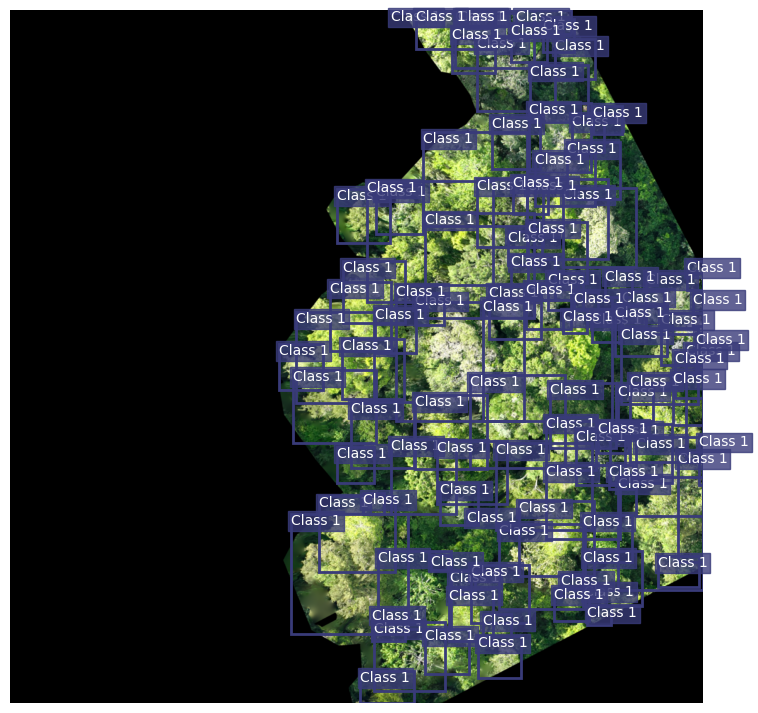

In [18]:
plot_image(
    img,
    boxes=target["boxes"],
    labels=target["labels"],
    class_names=["tree"],
)

In [19]:
train_loader = DataLoader(
    train_dataset,
    batch_size=CONFIG["batch_size"],
    shuffle=True,
    collate_fn=collate_fn,
    num_workers=CONFIG["num_workers"],
    pin_memory=True,
    persistent_workers=True,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=CONFIG["batch_size"],
    shuffle=False,
    collate_fn=collate_fn,
    num_workers=CONFIG["num_workers"],
    pin_memory=True,
    persistent_workers=True,
)

test_loader = DataLoader(
    test_dataset,
    batch_size=CONFIG["batch_size"],
    shuffle=False,
    collate_fn=collate_fn,
    num_workers=CONFIG["num_workers"],
    pin_memory=True,
    persistent_workers=True,
)

# Model definition

In [20]:
def get_model(num_classes, min_size=1024, max_size=2000):
    """
    Create Faster R-CNN model with custom anchor configuration.

    Args:
        num_classes: Number of classes (including background)
        min_size: Minimum image size for model input
        max_size: Maximum image size for model input
    """
    # --- Experimenting with Anchor Sizes ---
    # The paper notes trees vary from <2m to >50m.
    # At 4.5cm/px: 2m ~ 44px, 50m ~ 1100px.
    # However, with multi-resolution training, the "pixel size" of a tree changes dynamically.
    # A 50m tree cropped at 30m extent (impossible) vs 120m extent results in different pixel scales.
    #
    # We define an AnchorGenerator that covers small to large objects.
    # 5 sizes for 5 FPN levels (P2, P3, P4, P5, P6 usually, or P2-P6).
    # Default sizes: (32, 64, 128, 256, 512).
    # We maintain this spread as it covers approx 1.5m to 23m at 100% scale,
    # but covers much larger trees when the image is downscaled (simulating higher altitude).
    anchor_sizes = ((32,), (64,), (128,), (256,), (512,))

    # Aspect ratios: Trees are generally circular/square from above.
    # We prioritize 1.0, but keep 0.5 and 2.0 for irregular crowns or clusters.
    aspect_ratios = ((0.5, 1.0, 2.0),) * len(anchor_sizes)

    rpn_anchor_generator = AnchorGenerator(
        sizes=anchor_sizes, aspect_ratios=aspect_ratios
    )

    # Load pretrained model with custom configuration
    # Using weights_backbone to properly leverage ImageNet pretraining
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
        weights="DEFAULT",
        rpn_anchor_generator=rpn_anchor_generator,
        box_detections_per_img=300,  # Increase for dense tree detection
        min_size=min_size,  # Match multi-resolution training range
        max_size=max_size,  # Match multi-resolution training range
    )

    # Replace the classifier head for our number of classes
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

# Model training

In [25]:
def train_one_epoch(model, optimizer, data_loader, device, epoch):
    model.train()

    running_loss = 0.0
    running_cls_loss = 0.0
    running_box_reg_loss = 0.0
    valid_batches = 0

    for i, (images, targets) in tqdm(
        enumerate(data_loader), total=len(data_loader), desc=f"Training Epoch {epoch}"
    ):
        # Skip batches where all images have zero boxes (can happen with aggressive cropping)
        if all(len(t["boxes"]) == 0 for t in targets):
            print(f"Skipping batch {i}: all images have zero boxes")
            continue

        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        optimizer.zero_grad()

        try:
            # Forward pass
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            loss_value = losses.item()

            # Specific losses for detailed logging
            cls_loss = loss_dict["loss_classifier"].item()
            box_reg_loss = loss_dict["loss_box_reg"].item()

            if not math.isfinite(loss_value):
                print(f"Warning: Loss is {loss_value} at batch {i}")
                print(f"Loss Dict: {loss_dict}")
                print("Skipping this batch and continuing training...")
                continue

            losses.backward()

            # gradient clipping
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=10.0)

            optimizer.step()

            running_loss += loss_value
            running_cls_loss += cls_loss
            running_box_reg_loss += box_reg_loss
            valid_batches += 1

            if i % 10 == 0:
                wandb.log(
                    {
                        "train/batch_loss": loss_value,
                        "train/batch_cls_loss": cls_loss,
                        "train/batch_box_loss": box_reg_loss,
                    }
                )
        except RuntimeError as e:
            print(f"Error in batch {i}: {e}")
            print("Skipping this batch and continuing training...")
            torch.cuda.empty_cache()
            continue

    if valid_batches == 0:
        raise RuntimeError("No valid batches in this epoch!")

    epoch_loss = running_loss / valid_batches
    return epoch_loss


@torch.no_grad()
def evaluate_map(model, data_loader, device):
    model.eval()

    metric = MeanAveragePrecision(
        box_format="xyxy",
        iou_type="bbox",
        max_detection_thresholds=[1, 100, 400],
        class_metrics=True
    )

    for images, targets in tqdm(data_loader, desc="Validating"):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        targets_cpu = [{k: v.cpu() for k, v in t.items()} for t in targets]

        predictions = model(images)
        predictions = [{k: v.cpu() for k, v in p.items()} for p in predictions]

        metric.update(predictions, targets_cpu)

    results = metric.compute()
    return results

In [26]:
model = get_model(
    CONFIG["num_classes"],
    min_size=CONFIG["model_min_size"],
    max_size=CONFIG["model_max_size"],
)

model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(1024,), max_size=2000, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU

In [27]:
# 4. Optimizer & Scheduler
params = [p for p in model.parameters() if p.requires_grad]

optimizer = torch.optim.SGD(
    params,
    lr=CONFIG["learning_rate"],
    momentum=CONFIG["momentum"],
    weight_decay=CONFIG["weight_decay"],
)

lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer, step_size=CONFIG["step_size"], gamma=CONFIG["gamma"]
)

early_stopper = EarlyStopper(patience=CONFIG["patience"])

In [28]:
print("Starting training...")

best_map = 0.0
max_peak_mem = 0.0

# Setup checkpoint directory
if IN_COLAB:
    checkpoint_dir = "/content/drive/MyDrive/models/selvabox/"
    os.makedirs(checkpoint_dir, exist_ok=True)
else:
    checkpoint_dir = "../models/"
    os.makedirs(checkpoint_dir, exist_ok=True)

checkpoint_path = os.path.join(checkpoint_dir, "multi_res_faster_r_cnn.pth")
print(f"Checkpoint will be saved to: {checkpoint_path}")

# Memory tracking
torch.cuda.reset_peak_memory_stats()
start_train_time = time.time()

for epoch in tqdm(range(CONFIG["num_epochs"]), desc="Overall Training Progress"):
    epoch_start = time.time()

    # --- Train ---
    avg_train_loss = train_one_epoch(model, optimizer, train_loader, device, epoch)

    # --- Validation (Loss Proxy) ---
    val_metrics = evaluate_map(model, val_loader, device)
    val_map_50 = val_metrics["map_50"].item()
    val_map = val_metrics["map"].item()

    # --- Update Learning Rate ---
    lr_scheduler.step()
    curr_lr = optimizer.param_groups[0]["lr"]

    epoch_end = time.time()
    epoch_duration = (epoch_end - epoch_start) / 60
    peak_mem = torch.cuda.max_memory_allocated() / 1024 / 1024
    max_peak_mem = max(max_peak_mem, peak_mem)

    print(
        f"Epoch [{epoch + 1}/{CONFIG['num_epochs']}] "
        f"Train Loss: {avg_train_loss:.4f} | "
        f"Val mAP: {val_map:.6f} | "
        f"Val mAP_50: {val_map_50:.4f} | "
        f"Time: {epoch_duration:.1f}m | "
        f"Peak Mem: {peak_mem:.0f} MB"
    )

    # --- Logging ---
    wandb.log(
        {
            "epoch": epoch + 1,
            "train/epoch_loss": avg_train_loss,
            "val/mAP": val_map,
            "val/mAP_50": val_map_50,
            "learning_rate": curr_lr,
            "system/peak_mem_mb": peak_mem,
            "system/max_peak_mem_mb": max_peak_mem,
        }
    )

    # --- Save Best Model ---
    if val_map > best_map:
        best_map = val_map
        torch.save(
            {
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "map": best_map,
                "config": CONFIG,
            },
            checkpoint_path,
        )
        print(f"--> New Best Model Saved (mAP: {best_map:.4f})")

    # 6. Early Stopping
    early_stopper(val_map)
    if early_stopper.early_stop:
        print("--> Early stopping triggered.")
        break

    # 7. Flush Memory
    gc.collect()
    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()

total_train_time = (time.time() - start_train_time) / 60
print(f"Overall Memory Peak: {max_peak_mem:.0f} MB")
print(f"Best validation mAP: {best_map:.4f}")
print(f"Total training time: {total_train_time:.1f} minutes")
print("Training complete.")

Starting training...
Checkpoint will be saved to: /content/drive/MyDrive/models/selvabox/multi_res_faster_r_cnn.pth


Overall Training Progress:   0%|          | 0/20 [00:00<?, ?it/s]

Training Epoch 0:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [1/20] Train Loss: 1.9673 | Val mAP: 0.088701 | Val mAP_50: 0.2692 | Time: 11.6m | Peak Mem: 26988 MB
--> New Best Model Saved (mAP: 0.0887)


Training Epoch 1:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [2/20] Train Loss: 1.5916 | Val mAP: 0.111984 | Val mAP_50: 0.3197 | Time: 11.2m | Peak Mem: 28782 MB
--> New Best Model Saved (mAP: 0.1120)


Training Epoch 2:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [3/20] Train Loss: 1.5246 | Val mAP: 0.135763 | Val mAP_50: 0.3539 | Time: 11.2m | Peak Mem: 28019 MB
--> New Best Model Saved (mAP: 0.1358)


Training Epoch 3:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [4/20] Train Loss: 1.4689 | Val mAP: 0.136090 | Val mAP_50: 0.3623 | Time: 11.0m | Peak Mem: 26460 MB
--> New Best Model Saved (mAP: 0.1361)


Training Epoch 4:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [5/20] Train Loss: 1.4867 | Val mAP: 0.145925 | Val mAP_50: 0.3829 | Time: 11.5m | Peak Mem: 26760 MB
--> New Best Model Saved (mAP: 0.1459)


Training Epoch 5:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [6/20] Train Loss: 1.4890 | Val mAP: 0.148031 | Val mAP_50: 0.3874 | Time: 11.3m | Peak Mem: 25589 MB
--> New Best Model Saved (mAP: 0.1480)


Training Epoch 6:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [7/20] Train Loss: 1.4806 | Val mAP: 0.147373 | Val mAP_50: 0.3825 | Time: 10.9m | Peak Mem: 27227 MB
   --> EarlyStopping counter: 1 out of 5


Training Epoch 7:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [8/20] Train Loss: 1.4705 | Val mAP: 0.148112 | Val mAP_50: 0.3853 | Time: 11.0m | Peak Mem: 26286 MB
--> New Best Model Saved (mAP: 0.1481)


Training Epoch 8:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [9/20] Train Loss: 1.4535 | Val mAP: 0.147608 | Val mAP_50: 0.3827 | Time: 11.1m | Peak Mem: 26247 MB
   --> EarlyStopping counter: 1 out of 5


Training Epoch 9:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [10/20] Train Loss: 1.4811 | Val mAP: 0.147708 | Val mAP_50: 0.3836 | Time: 11.2m | Peak Mem: 26376 MB
   --> EarlyStopping counter: 2 out of 5


Training Epoch 10:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [11/20] Train Loss: 1.4596 | Val mAP: 0.147777 | Val mAP_50: 0.3837 | Time: 10.9m | Peak Mem: 28771 MB
   --> EarlyStopping counter: 3 out of 5


Training Epoch 11:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [12/20] Train Loss: 1.4602 | Val mAP: 0.147655 | Val mAP_50: 0.3833 | Time: 10.9m | Peak Mem: 27413 MB
   --> EarlyStopping counter: 4 out of 5


Training Epoch 12:   0%|          | 0/37 [00:00<?, ?it/s]

Validating:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [13/20] Train Loss: 1.4581 | Val mAP: 0.147672 | Val mAP_50: 0.3834 | Time: 11.5m | Peak Mem: 28025 MB
   --> EarlyStopping counter: 5 out of 5
--> Early stopping triggered.
Overall Memory Peak: 28782 MB
Best validation mAP: 0.1481
Total training time: 145.4 minutes
Training complete.


In [29]:
wandb.log(
    {
        "training/total_time_minutes": total_train_time,
        "training/best_val_map": best_map,
        "system/overall_peak_mem_mb": max_peak_mem,
    }
)

# Model evaluation

In [30]:
model = get_model(
    CONFIG["num_classes"],
    min_size=CONFIG["model_min_size"],
    max_size=CONFIG["model_max_size"],
)

In [31]:
# Load best model from checkpoint
if IN_COLAB:
    checkpoint_path = (
        "/content/drive/MyDrive/models/selvabox/multi_res_faster_r_cnn.pth"
    )
else:
    checkpoint_path = "../models/multi_res_faster_r_cnn.pth"

print(f"Loading checkpoint from: {checkpoint_path}")
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint["model_state_dict"])
model.to(device)

print(
    f"Loaded model from epoch {checkpoint['epoch']} with mAP: {checkpoint['map']:.4f}"
)

Loading checkpoint from: /content/drive/MyDrive/models/selvabox/multi_res_faster_r_cnn.pth
Loaded model from epoch 7 with mAP: 0.1481


In [32]:
# Initialize the metric
metric = MeanAveragePrecision(
    box_format="xyxy",
    iou_type="bbox",
    max_detection_thresholds=[1, 100, 400],
    class_metrics=True
)

model.eval()

# Assuming test_loader is defined
for images, targets in tqdm(test_loader, desc="Testing"):
    images = list(image.to(device) for image in images)

    # Forward pass
    with torch.no_grad():
        predictions = model(images)

    # Move to CPU (torchmetrics handles CPU/GPU, but consistency is good)
    predictions = [{k: v.cpu() for k, v in p.items()} for p in predictions]

    # Update the metric with this batch
    # targets need to be a list of dicts on the same device as predictions
    # If targets are on GPU, move to CPU to match predictions
    targets_cpu = [{k: v.cpu() for k, v in t.items()} for t in targets]

    metric.update(predictions, targets_cpu)

    # Clear GPU cache to prevent OOM errors
    torch.cuda.empty_cache()

# Compute the final metrics over the whole dataset
results = metric.compute()

# Print results
print(f"mAP (IoU=0.50:0.95): {results['map']:.4f}")
print(f"mAP (IoU=0.50): {results['map_50']:.4f}")
print(f"mAP (IoU=0.75): {results['map_75']:.4f}")

pprint(results)

Testing:   0%|          | 0/93 [00:00<?, ?it/s]

mAP (IoU=0.50:0.95): 0.1493
mAP (IoU=0.50): 0.4105
mAP (IoU=0.75): 0.1251
{'classes': tensor(1, dtype=torch.int32),
 'map': tensor(0.1493),
 'map_50': tensor(0.4105),
 'map_75': tensor(0.1251),
 'map_large': tensor(0.2368),
 'map_medium': tensor(0.0807),
 'map_per_class': tensor(0.1493),
 'map_small': tensor(0.0020),
 'mar_1': tensor(0.0061),
 'mar_100': tensor(0.2204),
 'mar_400': tensor(0.3030),
 'mar_400_per_class': tensor(0.3030),
 'mar_large': tensor(0.3815),
 'mar_medium': tensor(0.1872),
 'mar_small': tensor(0.0224)}


In [33]:
wandb.log(results)

In [34]:
wandb.finish()

classes,▁
epoch,▁▂▂▃▃▄▅▅▆▆▇▇█
learning_rate,██▂▂▂▁▁▁▁▁▁▁▁
map,▁
map_50,▁
map_75,▁
map_large,▁
map_medium,▁
map_per_class,▁
map_small,▁
+18,...


# Visualize results

Image 1 Predictions:


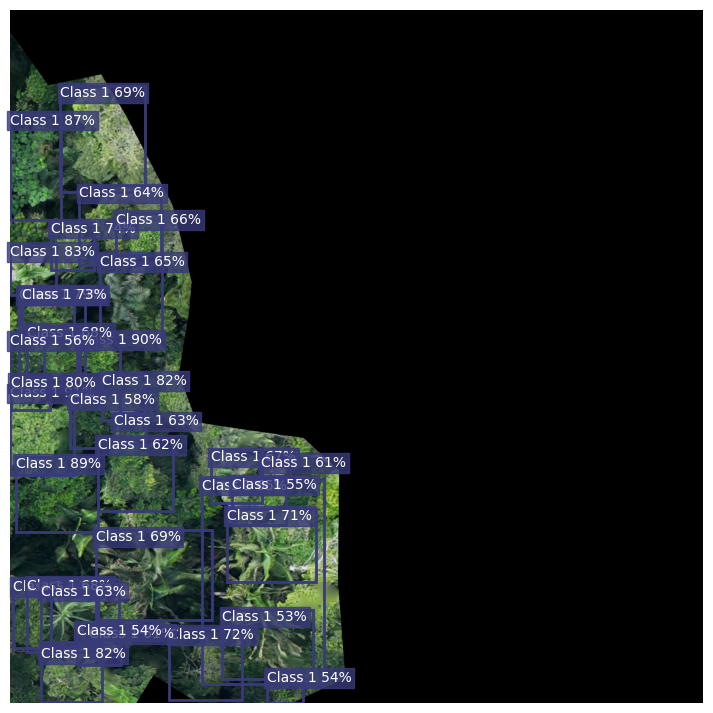

Image 1 Ground Truth:


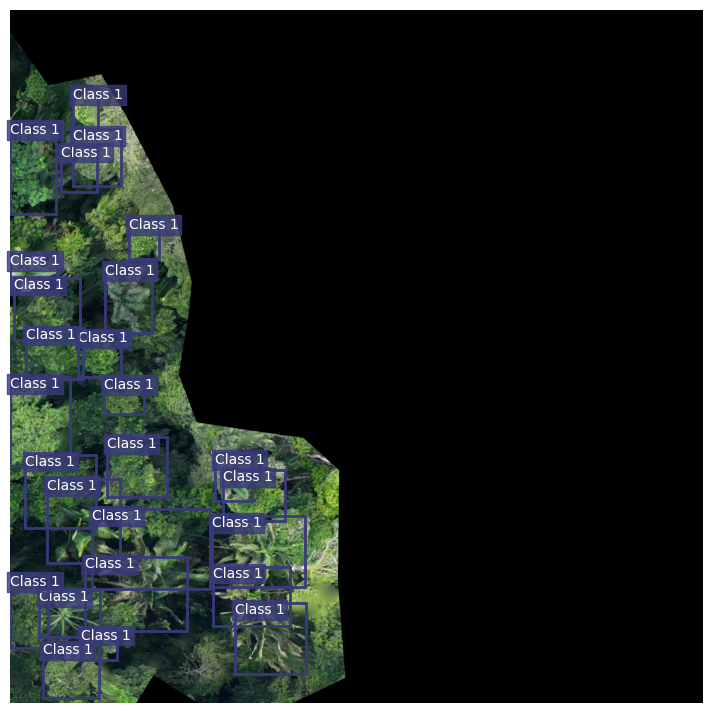

Image 2 Predictions:


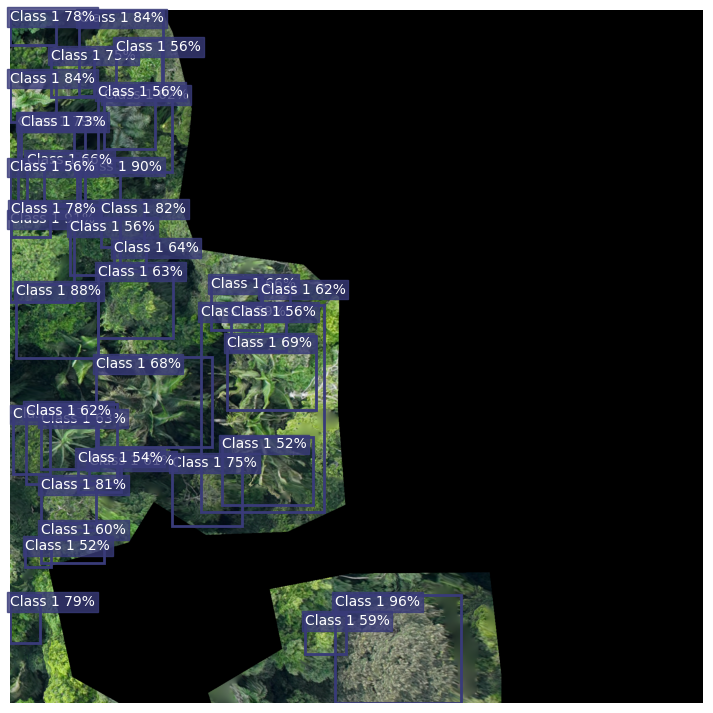

Image 2 Ground Truth:


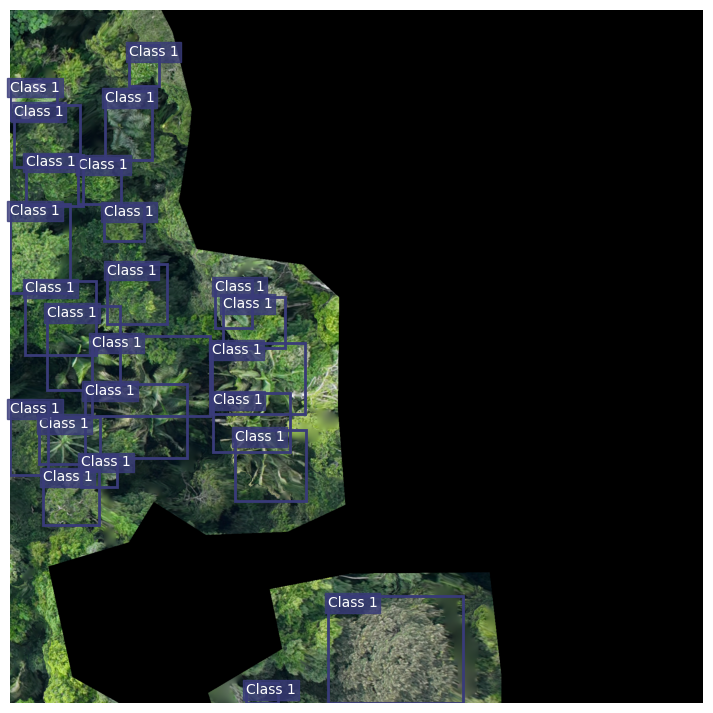

Image 3 Predictions:


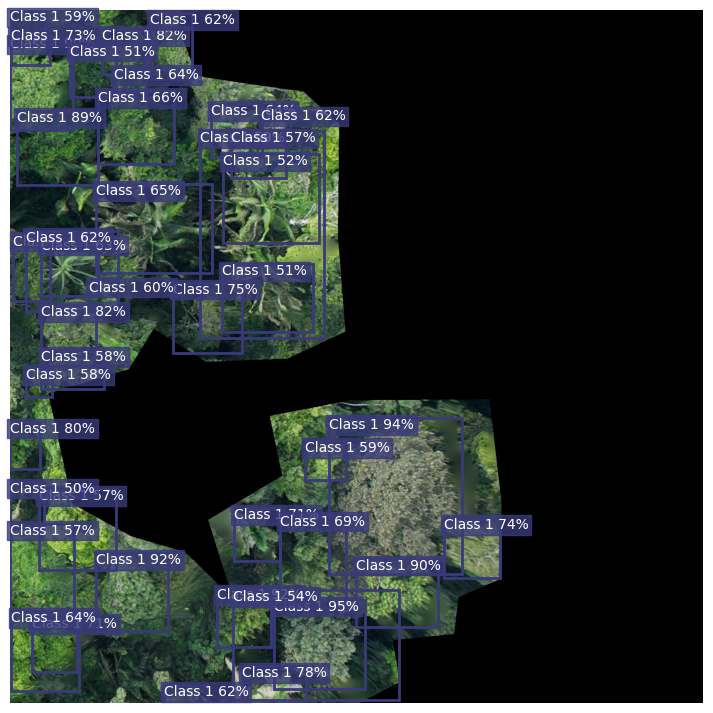

Image 3 Ground Truth:


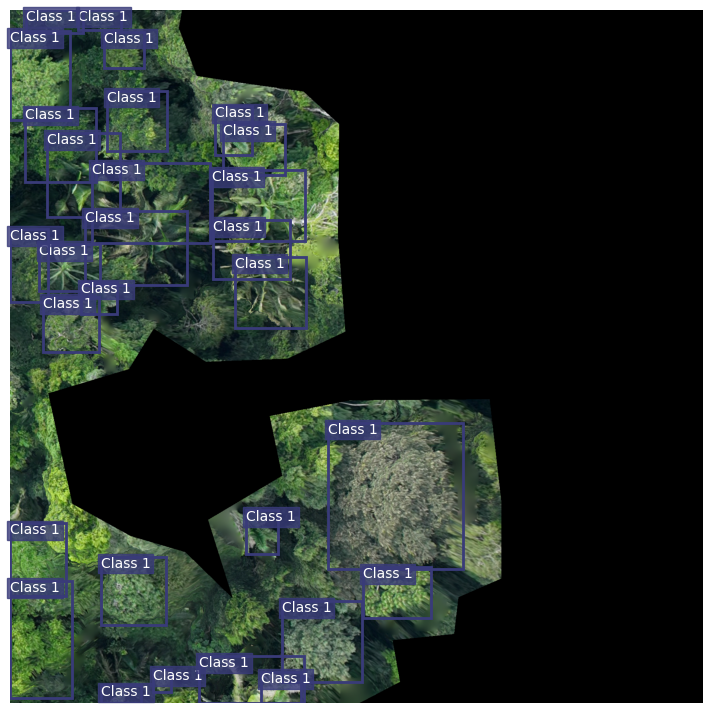

Image 4 Predictions:


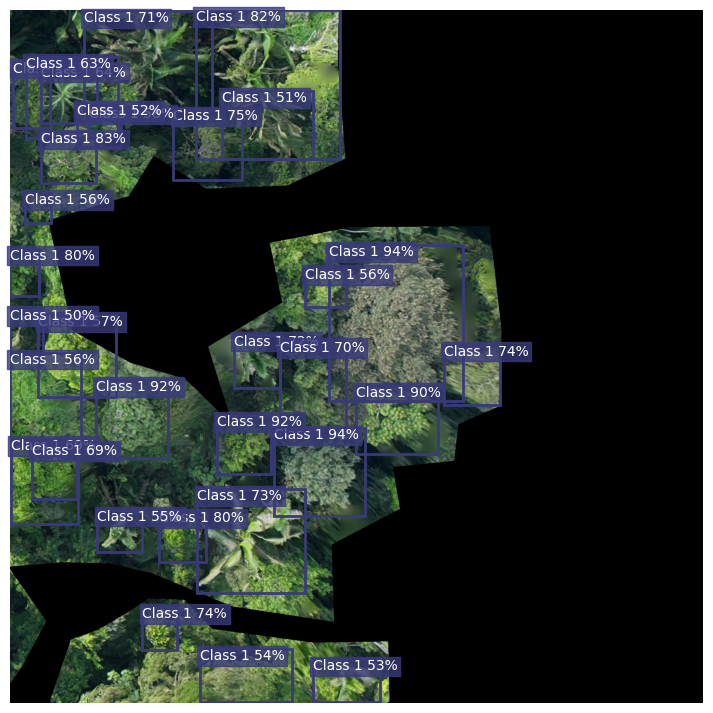

Image 4 Ground Truth:


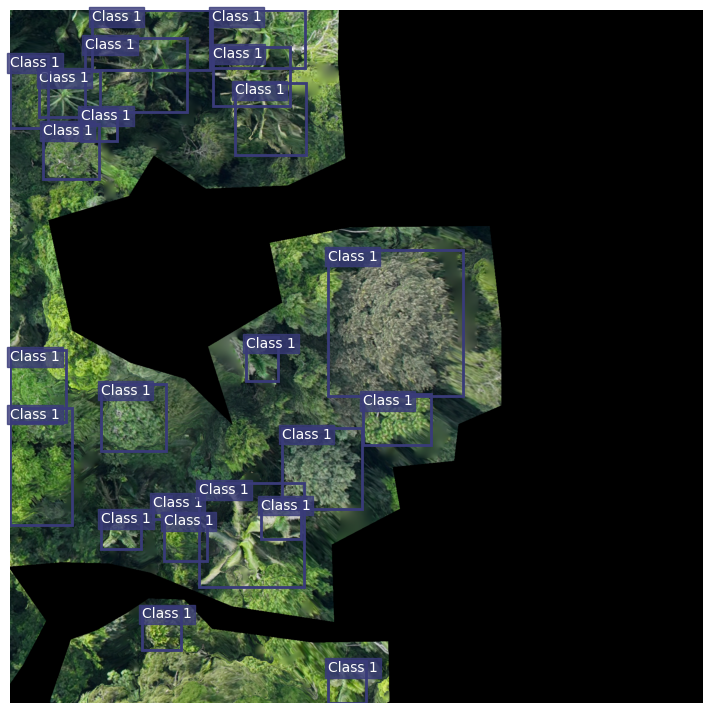

Image 5 Predictions:


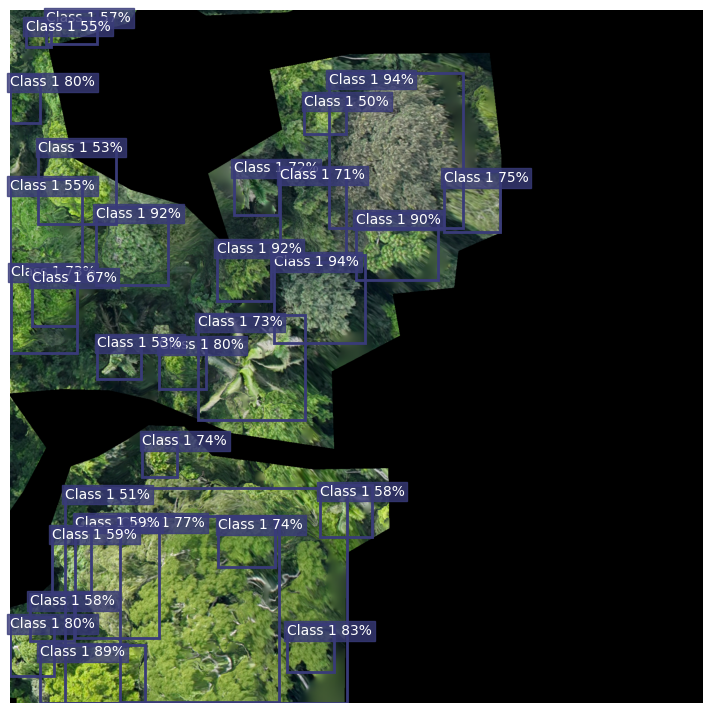

Image 5 Ground Truth:


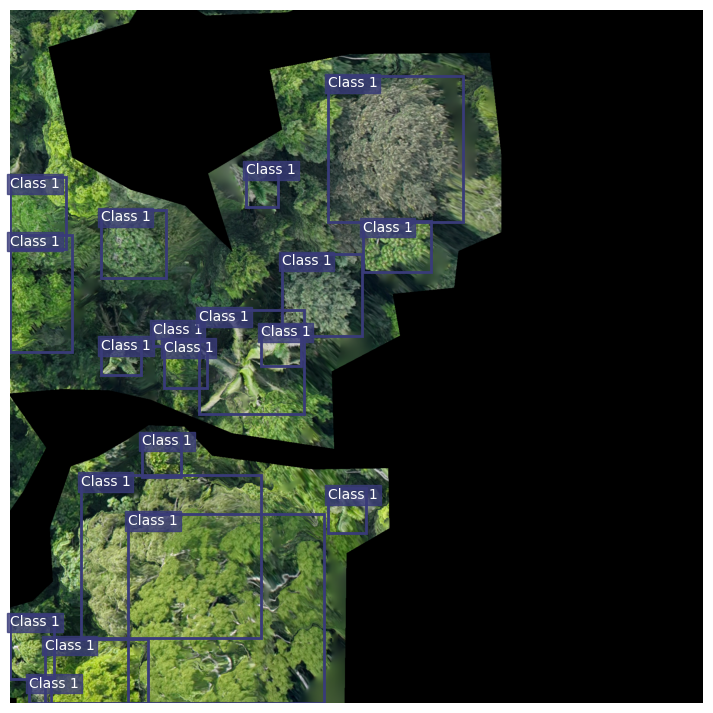

Image 6 Predictions:


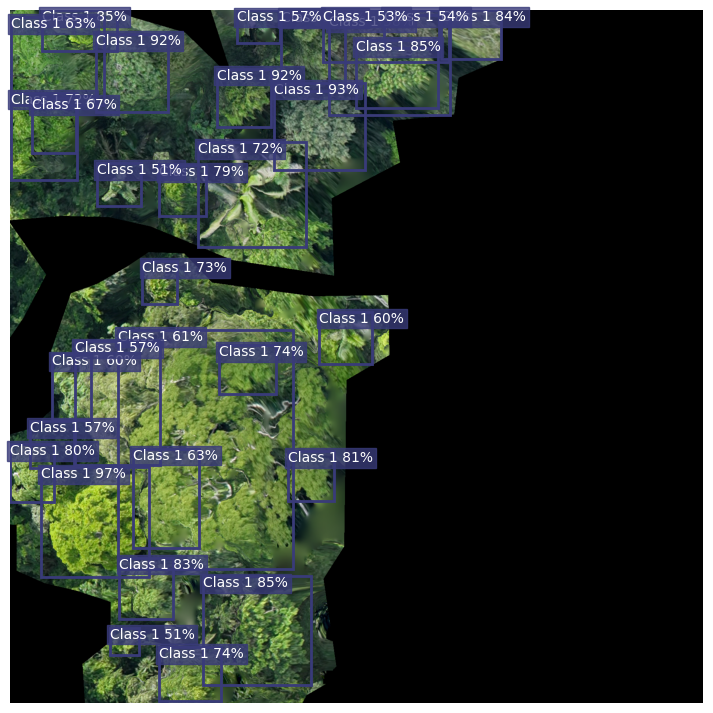

Image 6 Ground Truth:


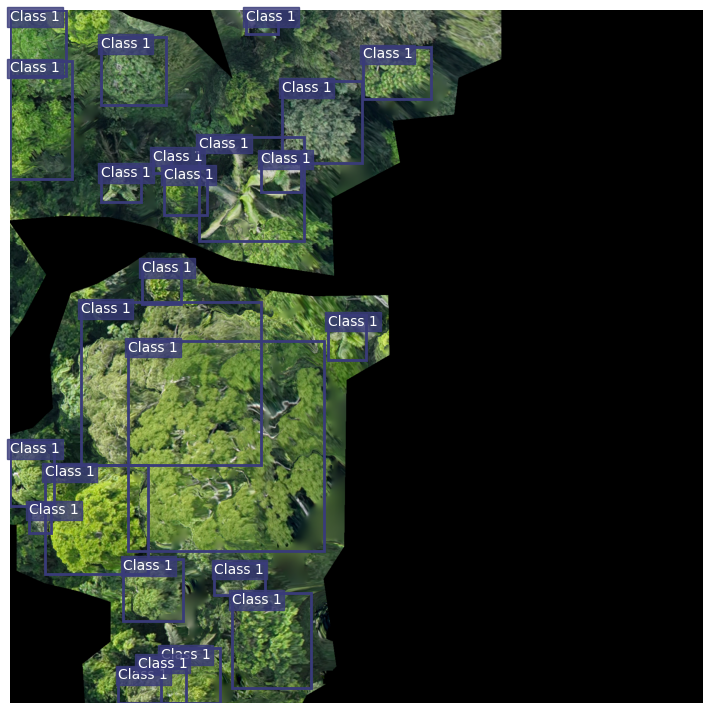

Image 7 Predictions:


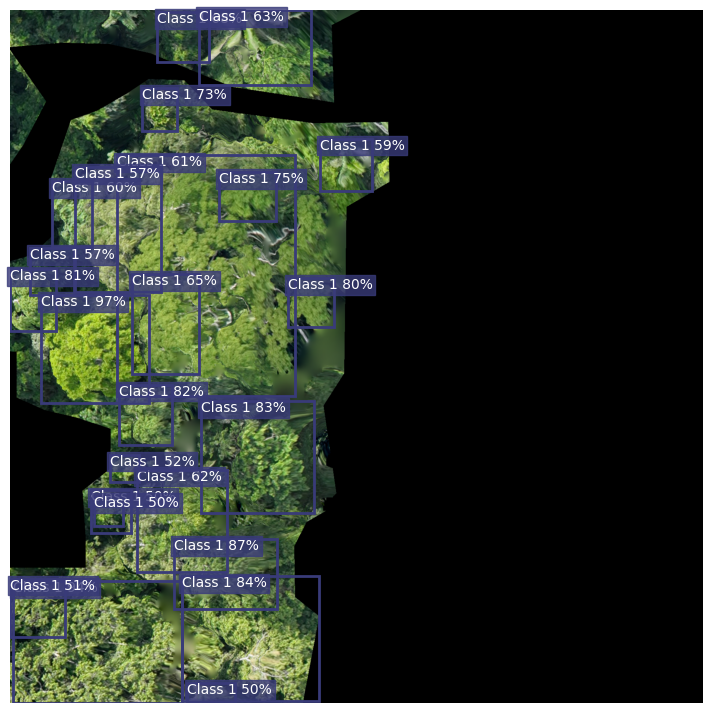

Image 7 Ground Truth:


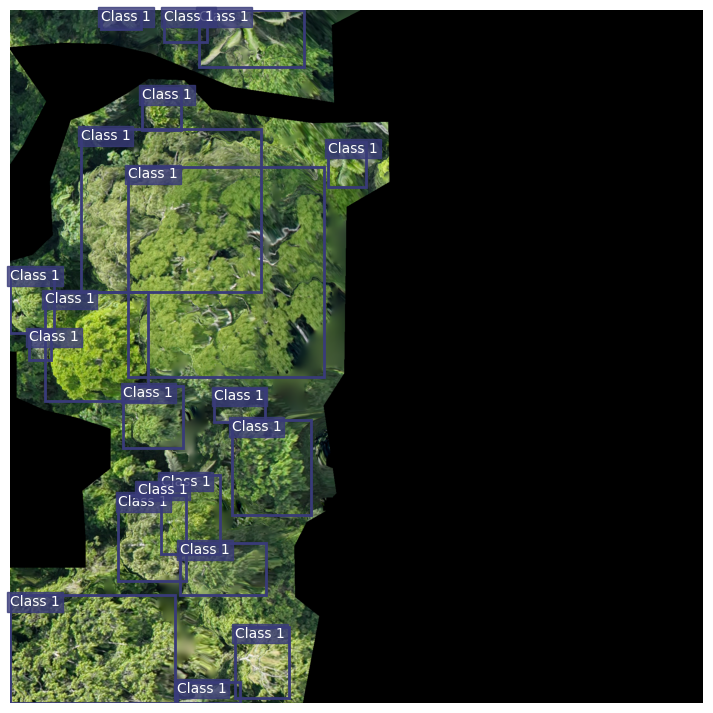

Image 8 Predictions:


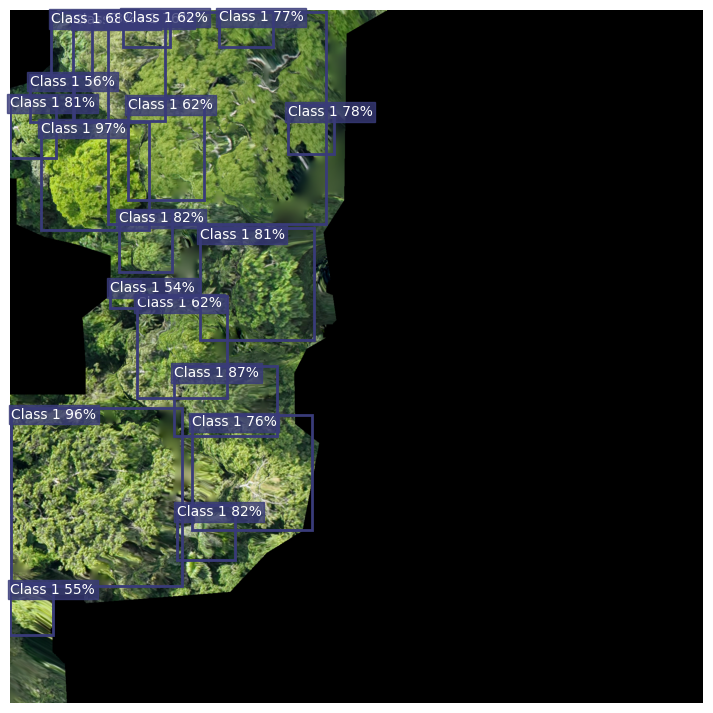

Image 8 Ground Truth:


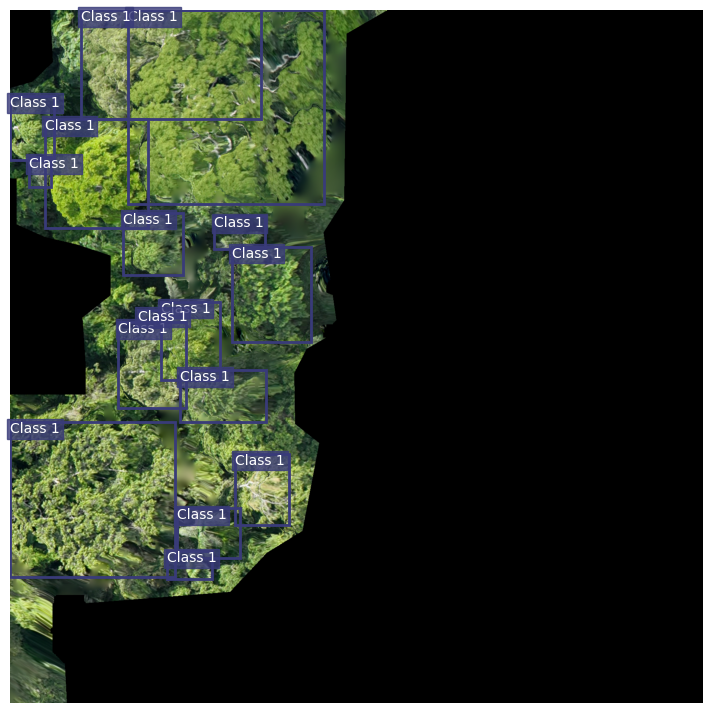

Image 9 Predictions:


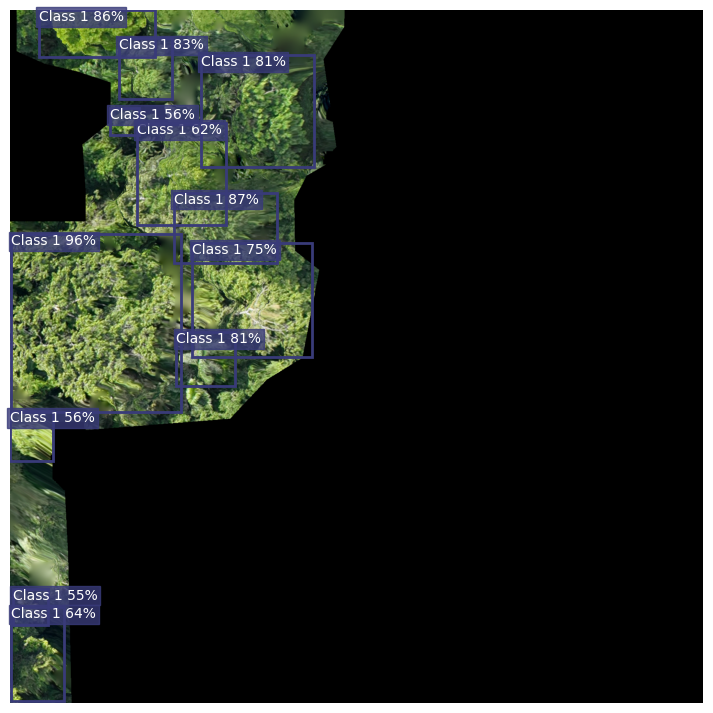

Image 9 Ground Truth:


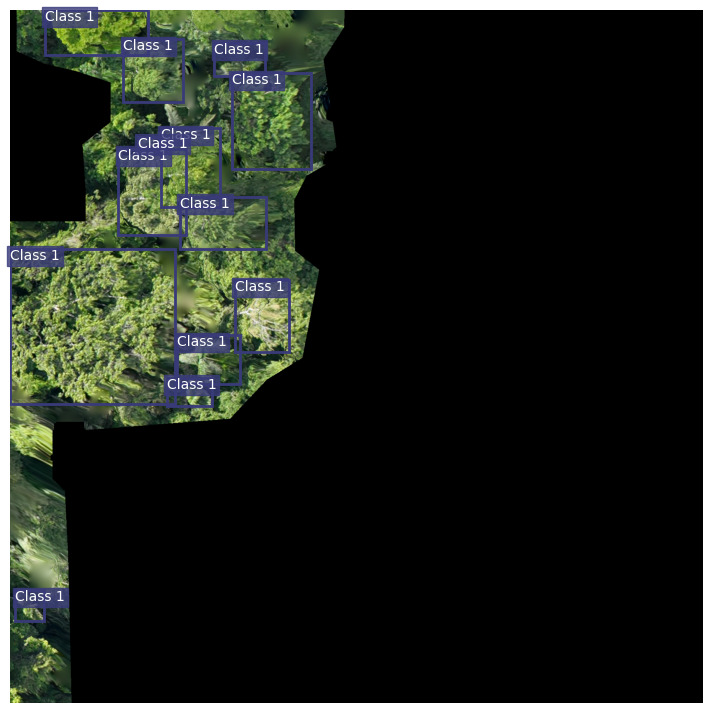

Image 10 Predictions:


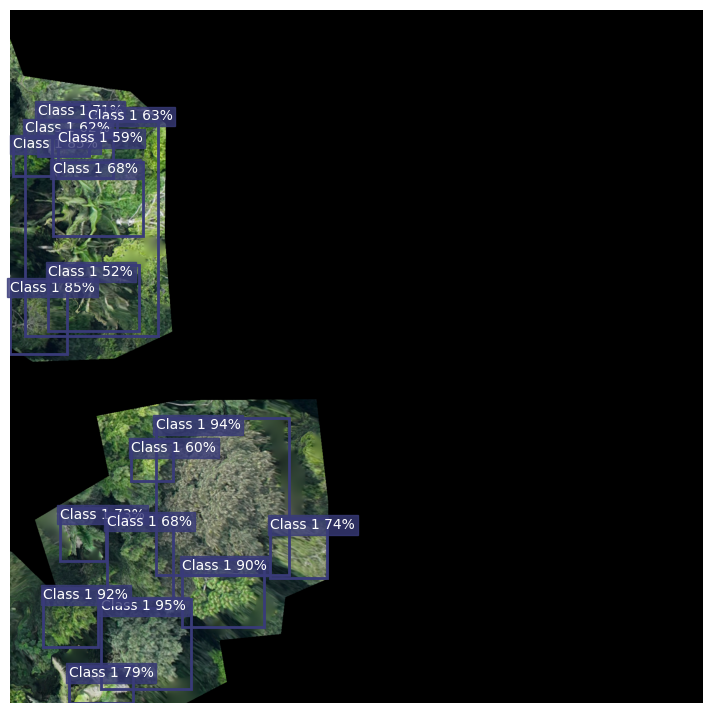

Image 10 Ground Truth:


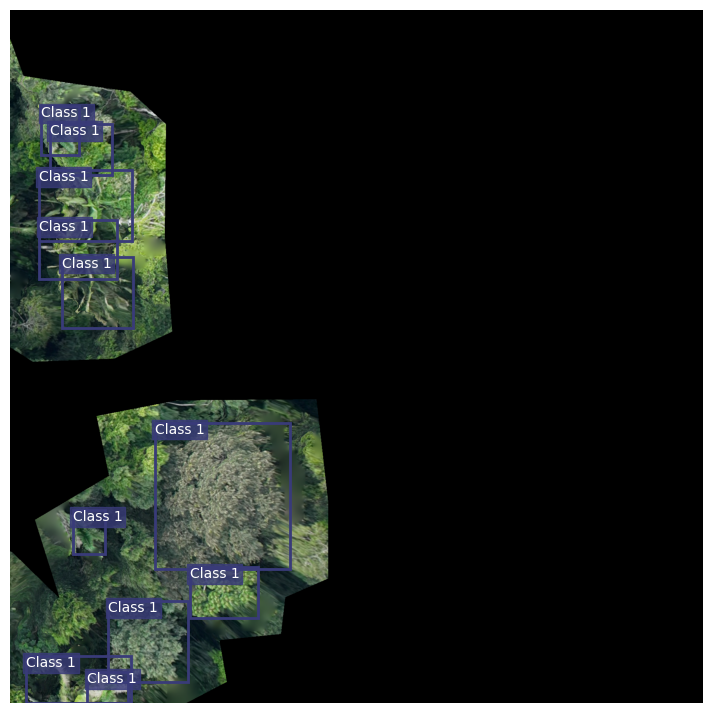

Image 11 Predictions:


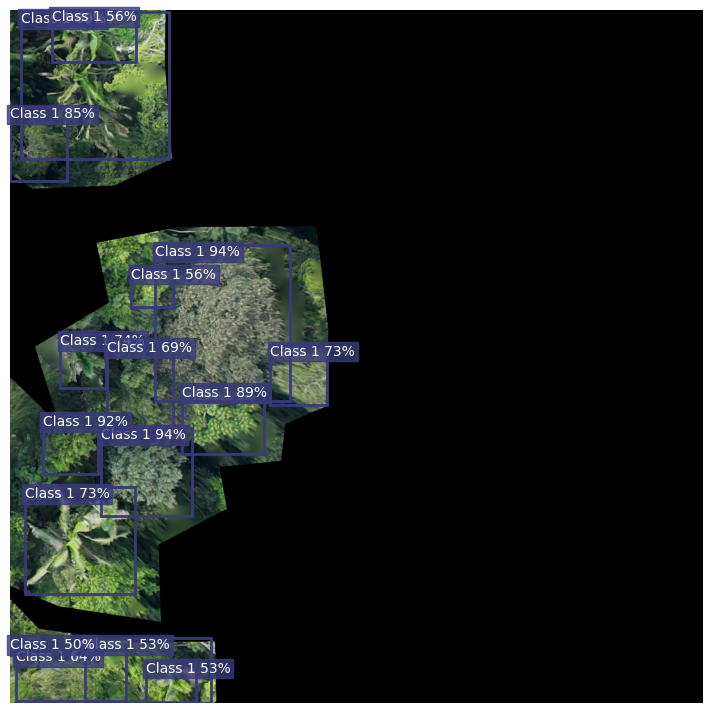

Image 11 Ground Truth:


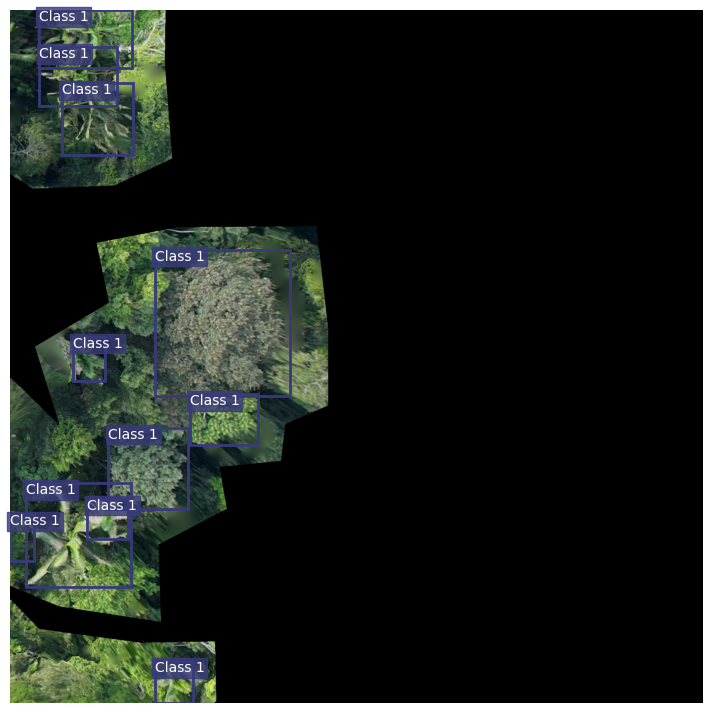

Image 12 Predictions:


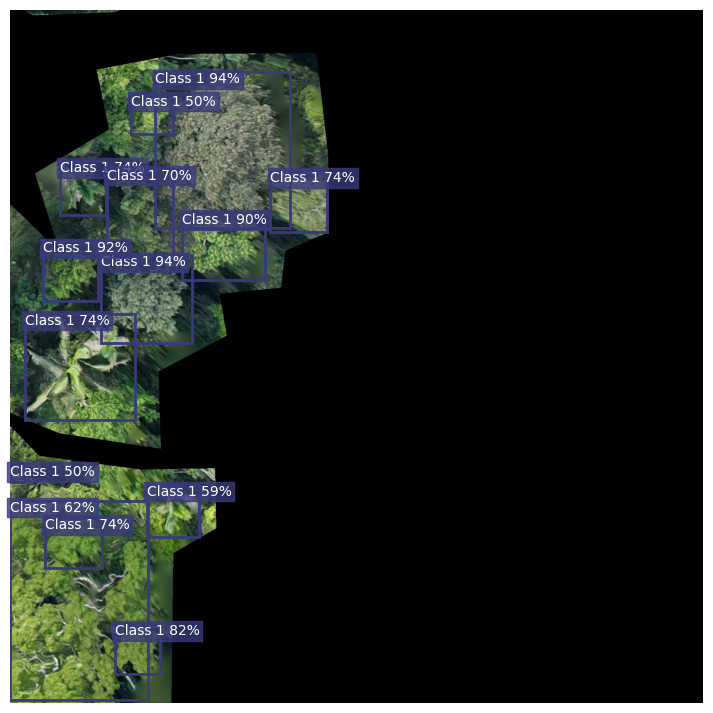

Image 12 Ground Truth:


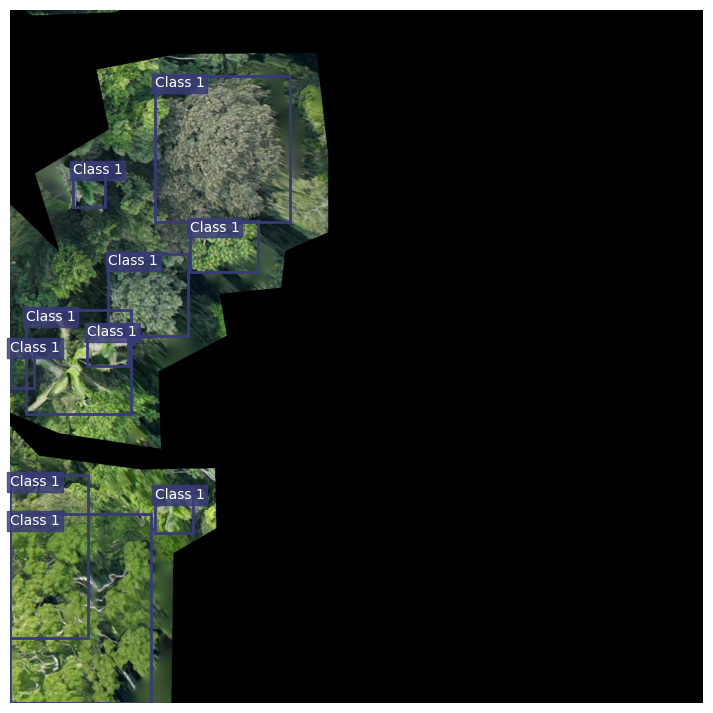

Image 13 Predictions:


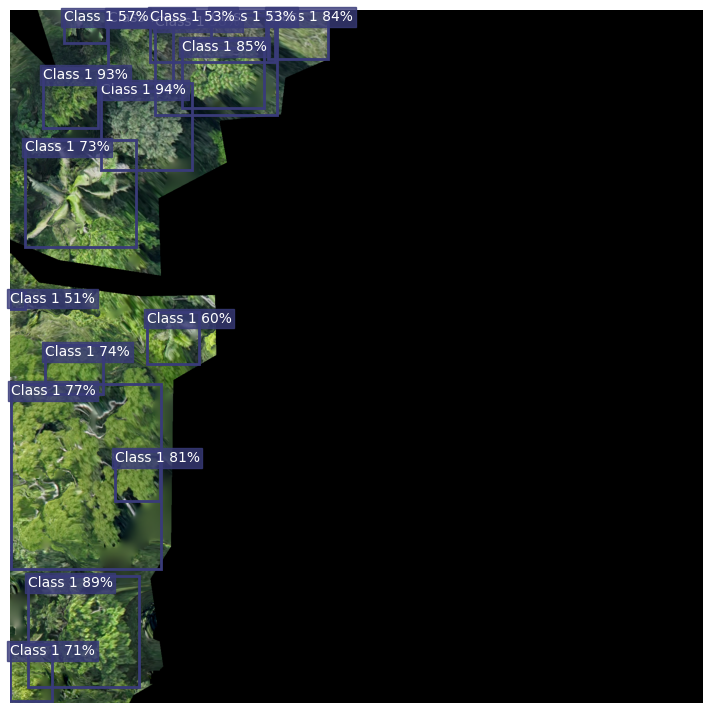

Image 13 Ground Truth:


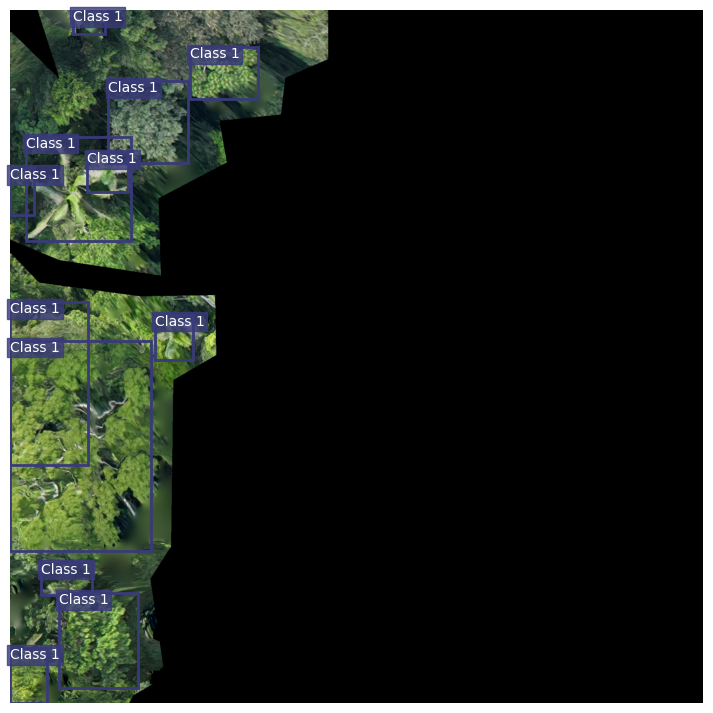

Image 14 Predictions:


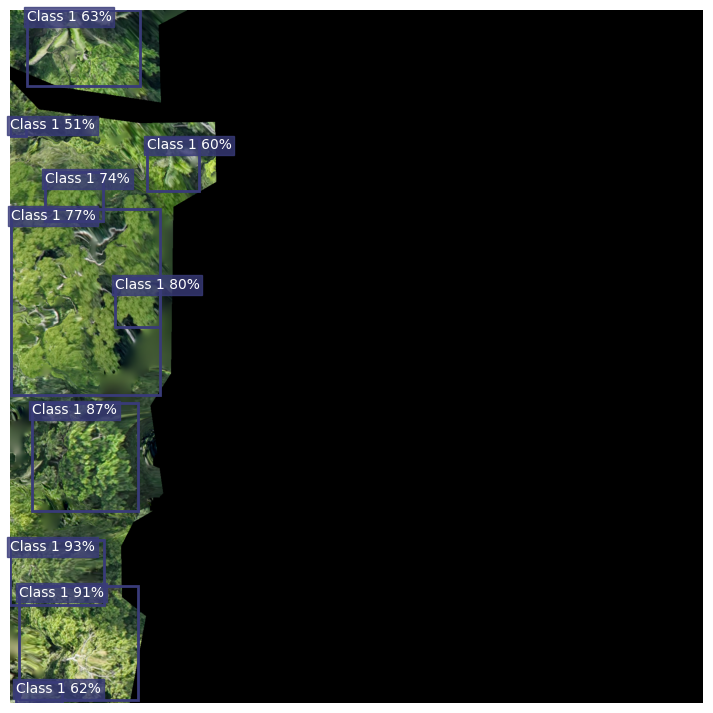

Image 14 Ground Truth:


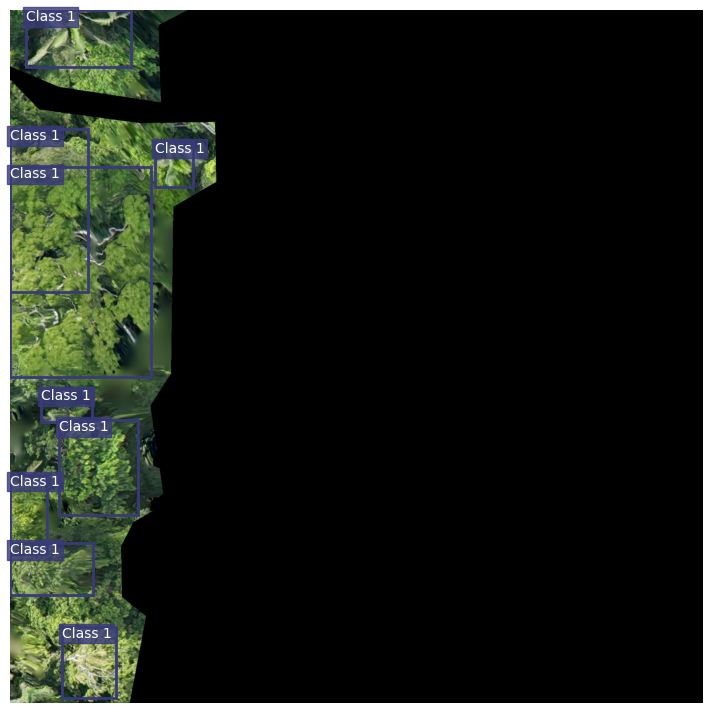

Image 15 Predictions:


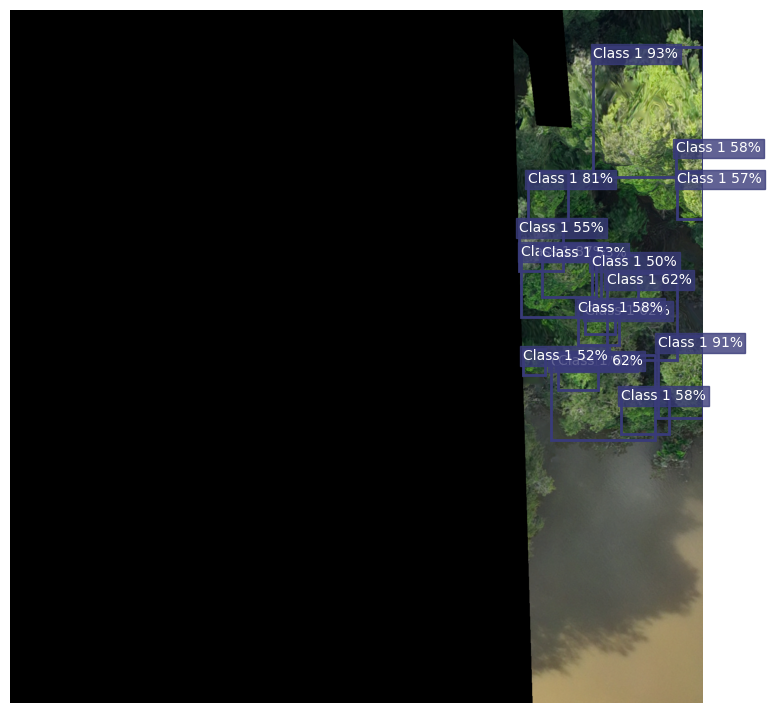

Image 15 Ground Truth:


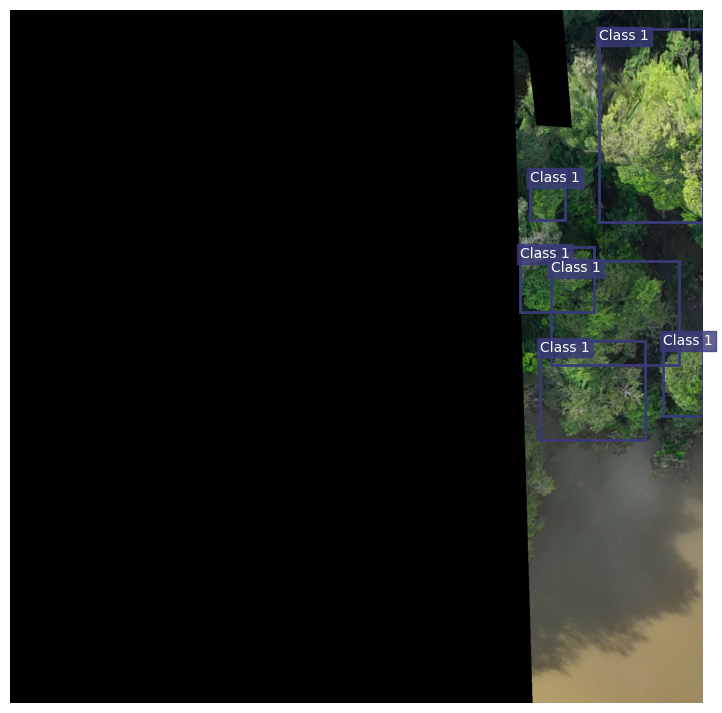

Image 16 Predictions:


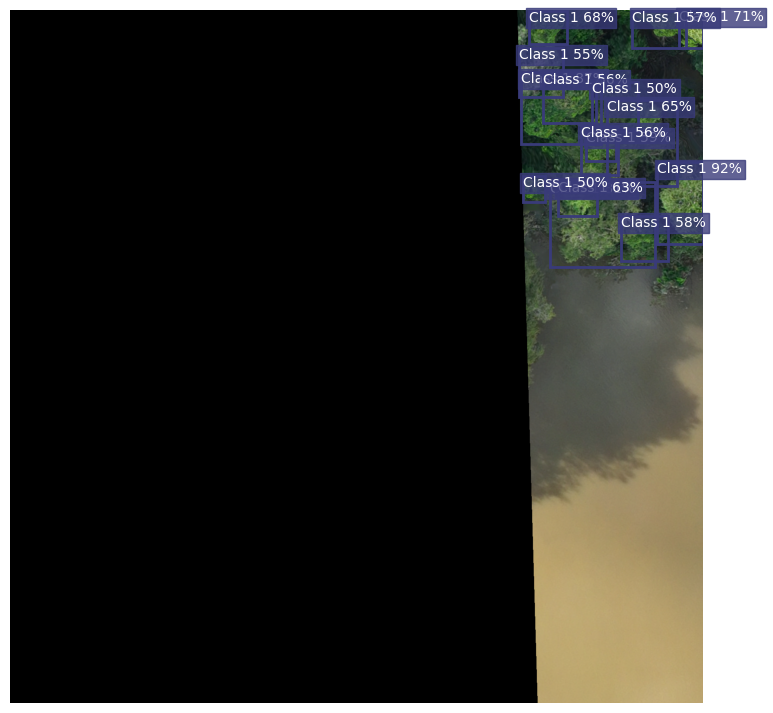

Image 16 Ground Truth:


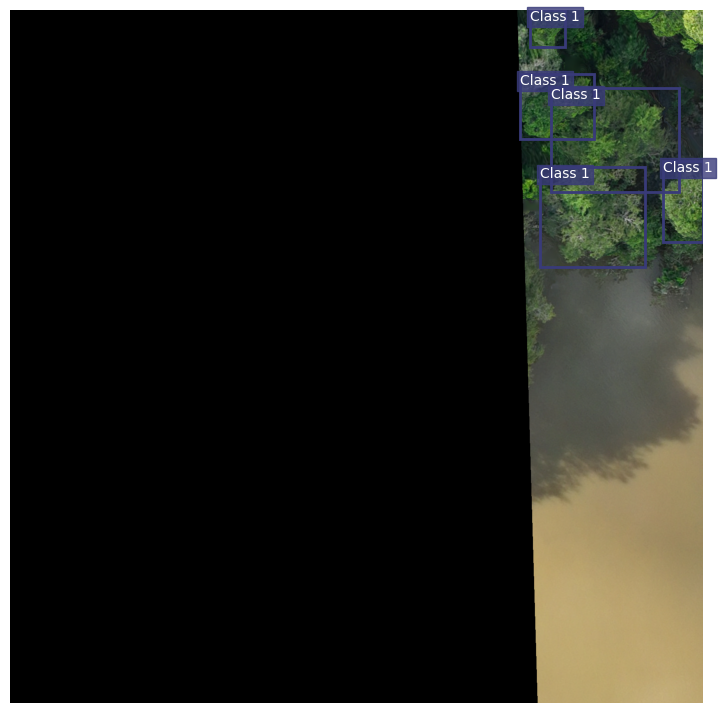

In [35]:
# visualize prediction and ground truth on some test images side by side
model.eval()

# Get a batch from the test set
test_iter = iter(test_loader)
images, targets = next(test_iter)

images = list(img.to(device) for img in images)

with torch.no_grad():
    predictions = model(images)

predictions = [{k: v.cpu() for k, v in p.items()} for p in predictions]

images = [img.cpu() for img in images]
targets = [{k: v.cpu() for k, v in t.items()} for t in targets]

for i in range(len(images)):
    img = images[i]
    pred = predictions[i]
    target = targets[i]

    # keep only predictions with score > 0.5
    keep_idxs = pred["scores"] > 0.5
    pred["boxes"] = pred["boxes"][keep_idxs]
    pred["scores"] = pred["scores"][keep_idxs]
    pred["labels"] = pred["labels"][keep_idxs]

    print(f"Image {i + 1} Predictions:")
    plot_image(
        img,
        boxes=pred["boxes"],
        scores=pred["scores"],
        labels=pred["labels"],
        class_names=["tree"],
        show=True,
    )

    print(f"Image {i + 1} Ground Truth:")
    plot_image(
        img,
        boxes=target["boxes"],
        labels=target["labels"],
        class_names=["tree"],
        show=True,
    )